In [1]:
import numpy as np
import pandas as pd
import re
import string

In [2]:
df_reddit=pd.read_csv("reddit_mental_health_combined_with_comments.csv")
df_reddit

,post_id,keyword,post_title,post_text,post_date,comments,source_method
0,1dg7p5a,depression,I wish someone would just...,Just fucking kill me. Shoot me. I wish I could...,2024-06-15 11:54:16,['Life is overall shitty and borderline unbear...,top
1,1dga2ht,depression,A friend of mine once described depression as ...,And felt like that is the most apt description...,2024-06-15 14:12:57,['Whenever I was younger and when I was at my ...,top
2,1f96hl3,depression,Therapist explained to me that normally people...,This has destroyed me. I’ve always thought may...,2024-09-05 07:54:46,['Sometimes I stew for HOURS on this. How are ...,top
3,1g9mnuy,depression,"Everyone says if you're depressed, don't be af...","Well, we try to. And guess what? No one cares....",2024-10-23 03:11:27,"[""Thing is, even if someone did care, I do not...",top
4,1g5uwhx,depression,Quiet quitting life,I am quiet quitting life and nobody realizes t...,2024-10-18 02:56:16,['Man holy shit I’ve never related to somethin...,top
...,...,...,...,...,...,...,...
49399,1m6hd27,BPD,Are you literally a now or never person?,"Hi guys, so I almost always refuse to do thin...",2025-07-23 01:06:43,['Yes I hate that I can be like this. I will h...,new
49400,1m6fxg9,BPD,happy cake day to me 🥳,it's been a year since i decided to explore th...,2025-07-23 00:12:25,"['Schizoid here, happy cake day :)', 'BPD, ADH...",new
49401,1m6f2uq,BPD,I am feeling like a dumbass right now,A girl behind me was in great pain because of ...,2025-07-22 23:38:38,[' Been there. Sometimes when our own systems...,new
49402,1m6ee0g,BPD,"Mom wouldn’t play with me, so I made up someon...","When I was a kid, I just wanted my mom to play...",2025-07-22 23:10:24,['Thank you for sharing. I can relate to that ...,new


In [3]:
df_reddit.isnull().sum()

post_id             0
keyword             0
post_title          0
post_text        1000
post_date           0
comments            0
source_method       0
dtype: int64

In [4]:
# Check shape and columns
print("Shape:", df_reddit.shape)
print("Columns:", df_reddit.columns)

# View sample data
print(df_reddit.head())

# Check data types
print(df_reddit.dtypes)

Shape: (49404, 7)
Columns: Index(['post_id', 'keyword', 'post_title', 'post_text', 'post_date',
       'comments', 'source_method'],
      dtype='object')
   post_id     keyword                                         post_title  \
0  1dg7p5a  depression                       I wish someone would just...   
1  1dga2ht  depression  A friend of mine once described depression as ...   
2  1f96hl3  depression  Therapist explained to me that normally people...   
3  1g9mnuy  depression  Everyone says if you're depressed, don't be af...   
4  1g5uwhx  depression                                Quiet quitting life   

                                           post_text            post_date  \
0  Just fucking kill me. Shoot me. I wish I could...  2024-06-15 11:54:16   
1  And felt like that is the most apt description...  2024-06-15 14:12:57   
2  This has destroyed me. I’ve always thought may...  2024-09-05 07:54:46   
3  Well, we try to. And guess what? No one cares....  2024-10-23 03:11:27 

In [5]:
df_reddit.isnull().sum()

post_id             0
keyword             0
post_title          0
post_text        1000
post_date           0
comments            0
source_method       0
dtype: int64

In [6]:
df_reddit.describe()

,post_id,keyword,post_title,post_text,post_date,comments,source_method
count,49404,49404,49404,48404,49404,49404,49404
unique,49404,14,47468,47958,49259,39263,4
top,1dg7p5a,mentalhealth,Help,"# NEW ""The Lost souls"" Discord: Safe place for...",2024-10-30 23:48:59,[],new
freq,1,4879,43,34,5,8721,20043


In [7]:
import pandas as pd
import re
import string
import ast
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS as sklearn_stopwords

# ---------- Combine Stopwords ----------
custom_stopwords = {
    "hi", "hello", "im", "ive", "ve", "go", "thing", "know", "time", "year","dont",
    "people", "work", "start", "day", "get", "say", "come", "make", "m", "w", "s", "t", "feel", "ago","bot","performed",
    "like", "just", "want", "see","action","discord","reddit","post","comment","reply","user","users","server","automatically","contact","message","moderators","team","support","help","issue","problem","question","answer","solution","feedback","discussion",
    "topic","thread","conversation","chat","discussion","forum","platform","community","group","channel","subreddit","sub","link","url","website","web","app","application","platforms","automated","reddit","www","https","http","https://","http://","com","org","net","io","co","info","biz","me","us","uk","ca","au","de","fr","es","it","jp","cn"}
combined_stopwords = sklearn_stopwords.union(custom_stopwords)

# ---------- Cleaning Functions ----------
def clean_text(text):
    if pd.isna(text):
        return ""
    text = str(text)
    text = re.sub(r"http\S+|www\S+|https\S+", "", text)
    text = re.sub(r"\n", " ", text)
    text = text.translate(str.maketrans("", "", string.punctuation))
    text = text.lower()
    return text.strip()

def basic_clean(text):
    text = text.lower()
    text = re.sub(r"[^a-z\s]", " ", text)
    text = re.sub(r"\s+", " ", text)
    return text.strip()

def remove_stopwords(text):
    tokens = text.split()
    filtered = [tok for tok in tokens if tok not in combined_stopwords]
    return " ".join(filtered)

def final_clean(text):
    text = clean_text(text)
    text = basic_clean(text)
    text = remove_stopwords(text)
    return text

# ---------- Apply Cleaning Pipeline ----------

# Step 1: Drop posts where post_text is missing
df_reddit = df_reddit.dropna(subset=['post_text']).copy()

# Step 2: Clean post text
df_reddit['post_text_clean'] = df_reddit['post_text'].apply(final_clean)

# Step 3: Safely evaluate comments string as list
df_reddit['comments'] = df_reddit['comments'].apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) and x.startswith('[') else x
)

# Step 4: Clean combined comment text
df_reddit['comments_clean'] = df_reddit['comments'].apply(
    lambda x: final_clean(" ".join(x)) if isinstance(x, list) else ""
)

# Step 5: Length features
df_reddit['post_length'] = df_reddit['post_text_clean'].apply(len)
df_reddit['num_comments_length'] = df_reddit['comments_clean'].apply(lambda x: len(x.split()))

# Step 6: Convert post_date to datetime
df_reddit['post_date'] = pd.to_datetime(df_reddit['post_date'], errors='coerce')


In [8]:
df_reddit

,post_id,keyword,post_title,post_text,post_date,comments,source_method,post_text_clean,comments_clean,post_length,num_comments_length
0,1dg7p5a,depression,I wish someone would just...,Just fucking kill me. Shoot me. I wish I could...,2024-06-15 11:54:16,[Life is overall shitty and borderline unbeara...,top,fucking kill shoot wish bed fucking wake anymo...,life overall shitty borderline unbearable goin...,834,125
1,1dga2ht,depression,A friend of mine once described depression as ...,And felt like that is the most apt description...,2024-06-15 14:12:57,[Whenever I was younger and when I was at my l...,top,felt apt description heard feels agree,younger lowest said home got older continued r...,38,145
2,1f96hl3,depression,Therapist explained to me that normally people...,This has destroyed me. I’ve always thought may...,2024-09-05 07:54:46,[Sometimes I stew for HOURS on this. How are p...,top,destroyed thought maybe severely depressed tol...,stew hours constantly gutted life surprises re...,245,97
3,1g9mnuy,depression,"Everyone says if you're depressed, don't be af...","Well, we try to. And guess what? No one cares....",2024-10-23 03:11:27,"[Thing is, even if someone did care, I do not ...",top,try guess cares busy lives problems hear youre...,did care dump issues burden literally wont car...,171,122
4,1g5uwhx,depression,Quiet quitting life,I am quiet quitting life and nobody realizes t...,2024-10-18 02:56:16,[Man holy shit I’ve never related to something...,top,quiet quitting life realizes friends think bad...,man holy shit related life right doing years s...,369,55
...,...,...,...,...,...,...,...,...,...,...,...
49399,1m6hd27,BPD,Are you literally a now or never person?,"Hi guys, so I almost always refuse to do thin...",2025-07-23 01:06:43,[Yes I hate that I can be like this. I will ho...,new,guys refuse things wanna unless right fuck min...,yes hate hold having conversations need wait e...,177,88
49400,1m6fxg9,BPD,happy cake day to me 🥳,it's been a year since i decided to explore th...,2025-07-23 00:12:25,"[Schizoid here, happy cake day :), BPD, ADHD, ...",new,decided explore little section internet pseudo...,schizoid happy cake bpd adhd anxiety narcissis...,149,9
49401,1m6f2uq,BPD,I am feeling like a dumbass right now,A girl behind me was in great pain because of ...,2025-07-22 23:38:38,[ Been there. Sometimes when our own systems ...,new,girl great pain fibromialgia started crying re...,systems overload barely enuf bucket care look ...,184,74
49402,1m6ee0g,BPD,"Mom wouldn’t play with me, so I made up someon...","When I was a kid, I just wanted my mom to play...",2025-07-22 23:10:24,[Thank you for sharing. I can relate to that f...,new,kid wanted mom play elaborate wanted sit inter...,thank sharing relate feeling hollowed mom stru...,1023,191


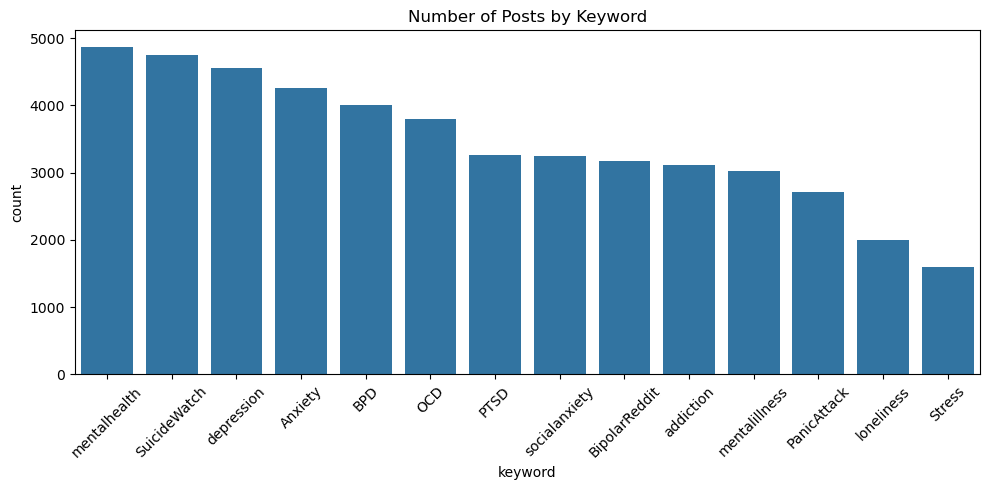

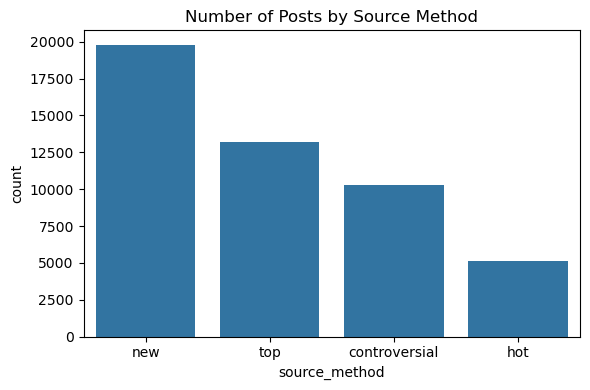

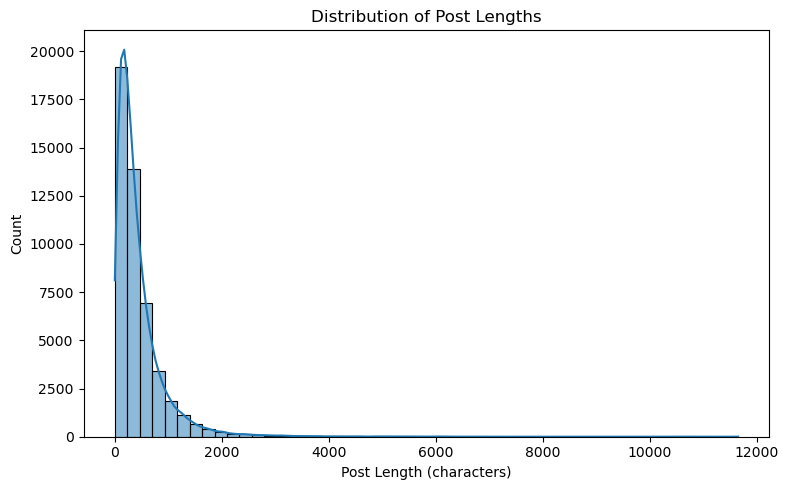

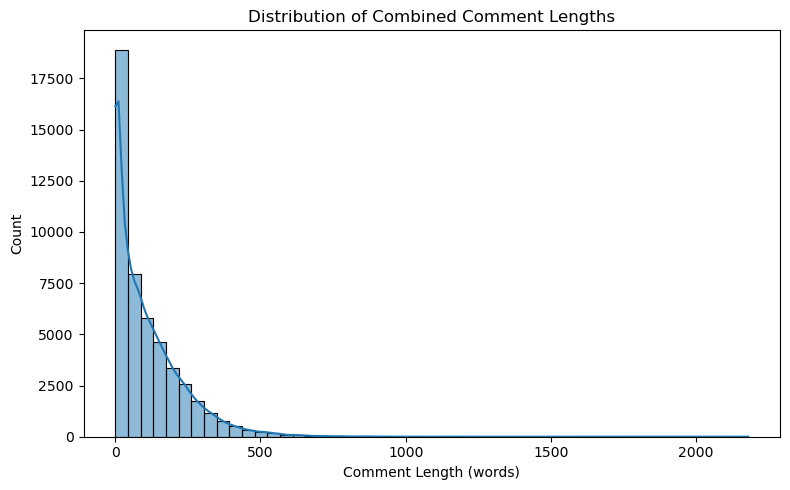

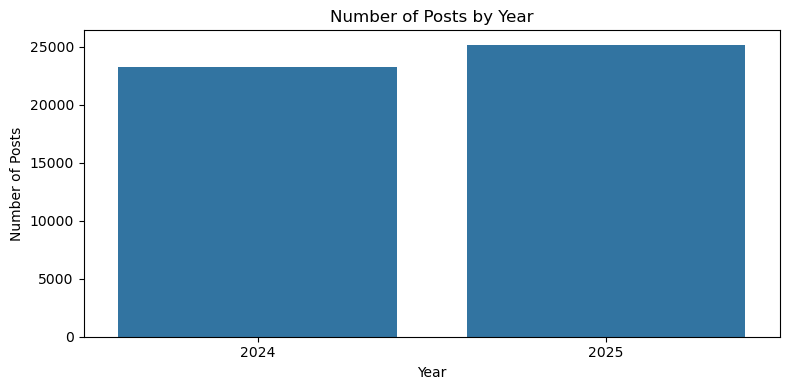

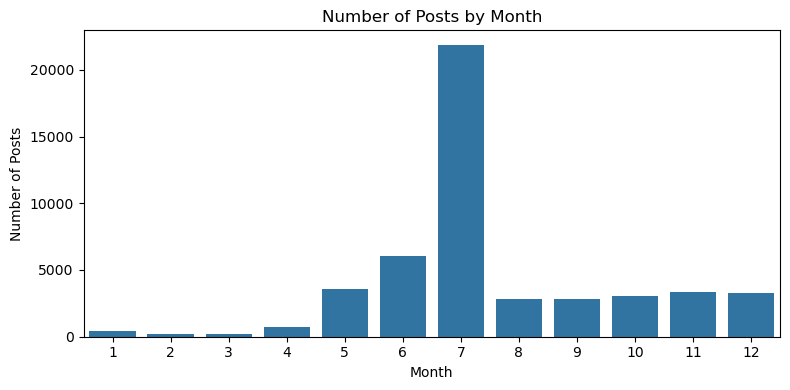

/var/folders/x7/xrth4_p955x331lrb98xvffh0000gn/T/ipykernel_9782/2783311375.py:62: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title='Keyword', bbox_to_anchor=(1.05, 1), loc='upper left')


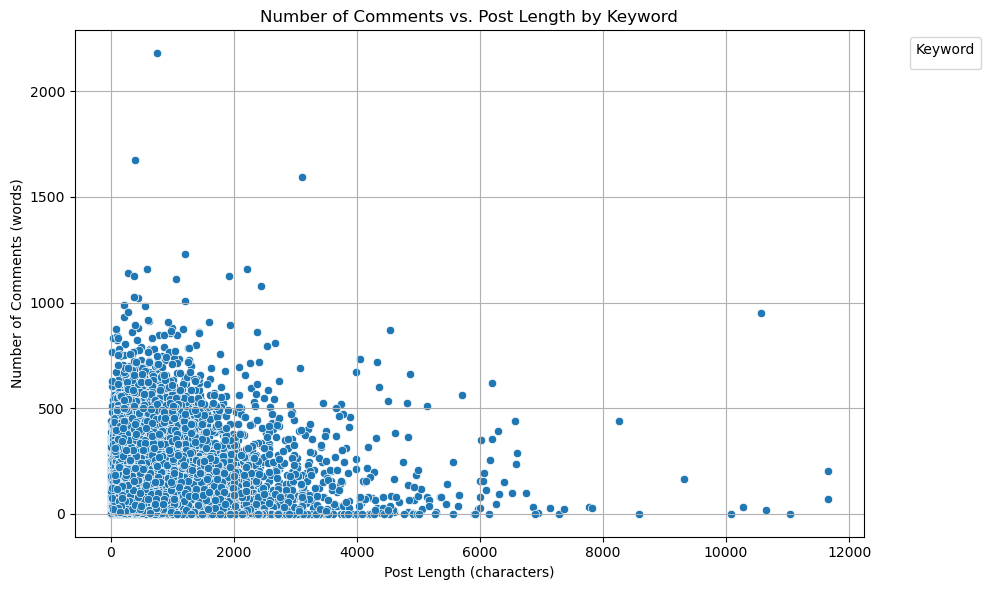

In [9]:
import seaborn as sns

import matplotlib.pyplot as plt

# --- Distribution of posts by keyword ---
plt.figure(figsize=(10, 5))
sns.countplot(data=df_reddit, x='keyword', order=df_reddit['keyword'].value_counts().index)
plt.title('Number of Posts by Keyword')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# --- Distribution of posts by source_method ---
plt.figure(figsize=(6, 4))
sns.countplot(data=df_reddit, x='source_method', order=df_reddit['source_method'].value_counts().index)
plt.title('Number of Posts by Source Method')
plt.tight_layout()
plt.show()

# --- Distribution of post lengths ---
plt.figure(figsize=(8, 5))
sns.histplot(df_reddit['post_length'], bins=50, kde=True)
plt.title('Distribution of Post Lengths')
plt.xlabel('Post Length (characters)')
plt.tight_layout()
plt.show()

# --- Distribution of comment lengths ---
plt.figure(figsize=(8, 5))
sns.histplot(df_reddit['num_comments_length'], bins=50, kde=True)
plt.title('Distribution of Combined Comment Lengths')
plt.xlabel('Comment Length (words)')
plt.tight_layout()
plt.show()

# --- Posts over time by year ---
plt.figure(figsize=(8, 4))
df_reddit['year'] = df_reddit['post_date'].dt.year
sns.countplot(data=df_reddit, x='year', order=sorted(df_reddit['year'].dropna().unique()))
plt.title('Number of Posts by Year')
plt.xlabel('Year')
plt.ylabel('Number of Posts')
plt.tight_layout()
plt.show()

# --- Posts over time by month ---
plt.figure(figsize=(8, 4))
df_reddit['month'] = df_reddit['post_date'].dt.month
sns.countplot(data=df_reddit, x='month', order=range(1, 13))
plt.title('Number of Posts by Month')
plt.xlabel('Month')
plt.ylabel('Number of Posts')
plt.tight_layout()
plt.show()
# posts vs comments
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_reddit, x='post_length', y='num_comments_length')
plt.title('Number of Comments vs. Post Length by Keyword')
plt.xlabel('Post Length (characters)')
plt.ylabel('Number of Comments (words)')
plt.grid(True)
plt.legend(title='Keyword', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


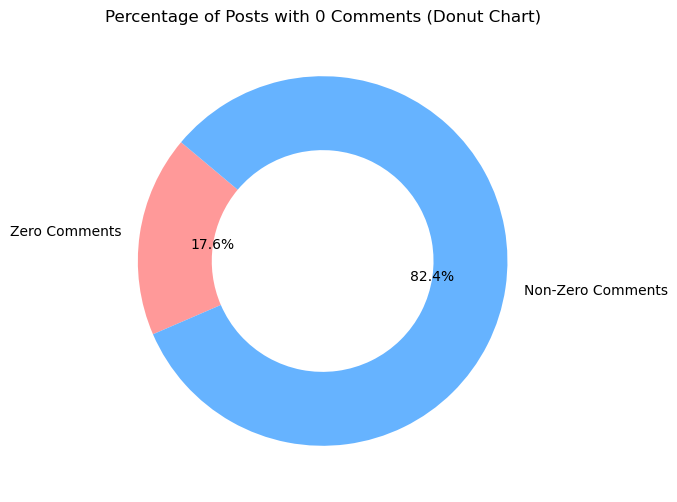

In [10]:
import matplotlib.pyplot as plt

# Calculate number and percentage of posts with 0 comments
num_zero_comments = (df_reddit['num_comments_length'] == 0).sum()
num_nonzero_comments = (df_reddit['num_comments_length'] != 0).sum()
sizes = [num_zero_comments, num_nonzero_comments]
labels = ['Zero Comments', 'Non-Zero Comments']
colors = ['#ff9999','#66b3ff']

# Pie chart
plt.figure(figsize=(6, 6))
plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140, wedgeprops=dict(width=0.4))
plt.title('Percentage of Posts with 0 Comments (Donut Chart)')
plt.show()


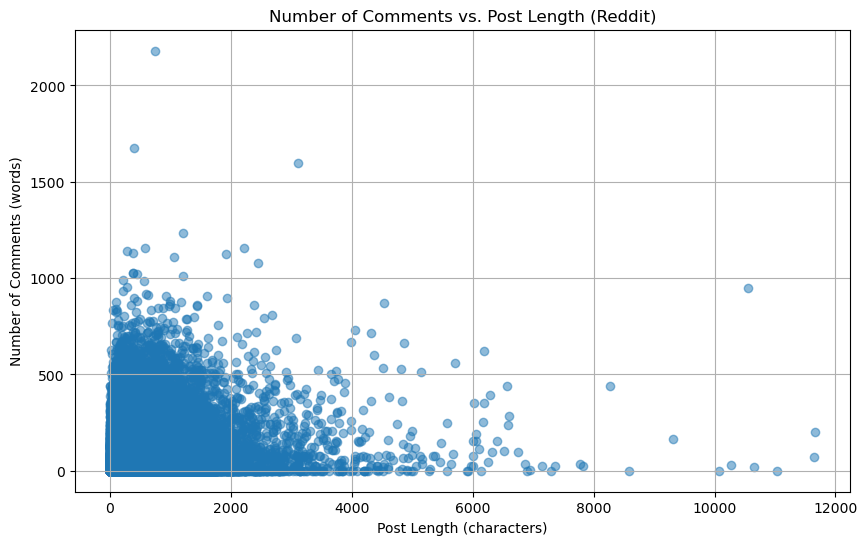

In [11]:
plt.figure(figsize=(10,6))
plt.scatter(df_reddit['post_length'], df_reddit['num_comments_length'], alpha=0.5)

plt.title('Number of Comments vs. Post Length (Reddit)')
plt.xlabel('Post Length (characters)')
plt.ylabel('Number of Comments (words)')
plt.grid(True)
plt.show()

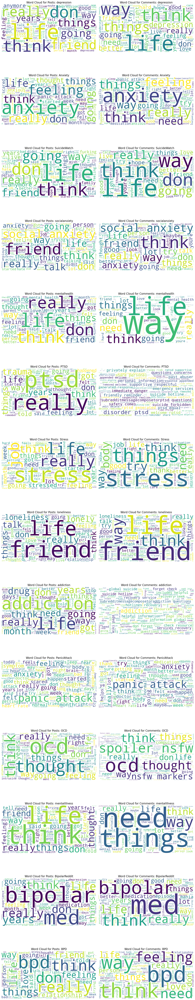

In [12]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Generate word clouds for posts and comments for each keyword
unique_keywords = df_reddit['keyword'].unique()
fig, axes = plt.subplots(nrows=len(unique_keywords), ncols=2, figsize=(16, 6 * len(unique_keywords)))

if len(unique_keywords) == 1:
    axes = [axes]

for i, kw in enumerate(unique_keywords):
    # Posts
    post_text = " ".join(df_reddit.loc[df_reddit['keyword'] == kw, 'post_text_clean'])
    wc_post = WordCloud(width=800, height=400, background_color='white').generate(post_text)
    axes[i, 0].imshow(wc_post, interpolation='bilinear')
    axes[i, 0].set_title(f'Word Cloud for Posts: {kw}', fontsize=16)
    axes[i, 0].axis('off')
    
    # Comments
    comment_text = " ".join(df_reddit.loc[df_reddit['keyword'] == kw, 'comments_clean'])
    wc_comment = WordCloud(width=800, height=400, background_color='white').generate(comment_text)
    axes[i, 1].imshow(wc_comment, interpolation='bilinear')
    axes[i, 1].set_title(f'Word Cloud for Comments: {kw}', fontsize=16)
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()

In [13]:
import spacy
from tqdm import tqdm

nlp = spacy.load("en_core_web_sm", disable=["parser", "ner"])

def spacy_lemmatize(text):
    if pd.isna(text) or not text:
        return []
    doc = nlp(text)
    return [token.lemma_ for token in doc if not token.is_space]

# Lemmatize posts and comments
df_reddit['post_lemmas'] = [spacy_lemmatize(text) for text in tqdm(df_reddit['post_text_clean'], desc="Lemmatizing posts")]
df_reddit['comment_lemmas'] = [spacy_lemmatize(text) for text in tqdm(df_reddit['comments_clean'], desc="Lemmatizing comments")]
df_reddit['post_title_lemmas'] = [spacy_lemmatize(text) for text in tqdm(df_reddit['post_title'], desc="Lemmatizing post titles")]


Lemmatizing post titles: 100%|██████████| 48404/48404 [01:28<00:00, 545.90it/s]


In [14]:
df_reddit

,post_id,keyword,post_title,post_text,post_date,comments,source_method,post_text_clean,comments_clean,post_length,num_comments_length,year,month,post_lemmas,comment_lemmas,post_title_lemmas
0,1dg7p5a,depression,I wish someone would just...,Just fucking kill me. Shoot me. I wish I could...,2024-06-15 11:54:16,[Life is overall shitty and borderline unbeara...,top,fucking kill shoot wish bed fucking wake anymo...,life overall shitty borderline unbearable goin...,834,125,2024,6,"[fucking, kill, shoot, wish, bed, fucking, wak...","[life, overall, shitty, borderline, unbearable...","[I, wish, someone, would, just, ...]"
1,1dga2ht,depression,A friend of mine once described depression as ...,And felt like that is the most apt description...,2024-06-15 14:12:57,[Whenever I was younger and when I was at my l...,top,felt apt description heard feels agree,younger lowest said home got older continued r...,38,145,2024,6,"[feel, apt, description, hear, feel, agree]","[younger, lowest, say, home, get, old, continu...","[a, friend, of, mine, once, describe, depressi..."
2,1f96hl3,depression,Therapist explained to me that normally people...,This has destroyed me. I’ve always thought may...,2024-09-05 07:54:46,[Sometimes I stew for HOURS on this. How are p...,top,destroyed thought maybe severely depressed tol...,stew hours constantly gutted life surprises re...,245,97,2024,9,"[destroy, think, maybe, severely, depressed, t...","[stew, hour, constantly, gutte, life, surprise...","[Therapist, explain, to, I, that, normally, pe..."
3,1g9mnuy,depression,"Everyone says if you're depressed, don't be af...","Well, we try to. And guess what? No one cares....",2024-10-23 03:11:27,"[Thing is, even if someone did care, I do not ...",top,try guess cares busy lives problems hear youre...,did care dump issues burden literally wont car...,171,122,2024,10,"[try, guess, care, busy, life, problem, hear, ...","[do, care, dump, issue, burden, literally, wil...","[everyone, say, if, you, be, depressed, ,, do,..."
4,1g5uwhx,depression,Quiet quitting life,I am quiet quitting life and nobody realizes t...,2024-10-18 02:56:16,[Man holy shit I’ve never related to something...,top,quiet quitting life realizes friends think bad...,man holy shit related life right doing years s...,369,55,2024,10,"[quiet, quit, life, realize, friend, think, ba...","[man, holy, shit, relate, life, right, do, yea...","[quiet, quit, life]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49399,1m6hd27,BPD,Are you literally a now or never person?,"Hi guys, so I almost always refuse to do thin...",2025-07-23 01:06:43,[Yes I hate that I can be like this. I will ho...,new,guys refuse things wanna unless right fuck min...,yes hate hold having conversations need wait e...,177,88,2025,7,"[guy, refuse, thing, wanna, unless, right, fuc...","[yes, hate, hold, have, conversation, need, wa...","[be, you, literally, a, now, or, never, person..."
49400,1m6fxg9,BPD,happy cake day to me 🥳,it's been a year since i decided to explore th...,2025-07-23 00:12:25,"[Schizoid here, happy cake day :), BPD, ADHD, ...",new,decided explore little section internet pseudo...,schizoid happy cake bpd adhd anxiety narcissis...,149,9,2025,7,"[decide, explore, little, section, internet, p...","[schizoid, happy, cake, bpd, adhd, anxiety, na...","[happy, cake, day, to, I, 🥳]"
49401,1m6f2uq,BPD,I am feeling like a dumbass right now,A girl behind me was in great pain because of ...,2025-07-22 23:38:38,[ Been there. Sometimes when our own systems ...,new,girl great pain fibromialgia started crying re...,systems overload barely enuf bucket care look ...,184,74,2025,7,"[girl, great, pain, fibromialgia, start, cry, ...","[system, overload, barely, enuf, bucket, care,...","[I, be, feel, like, a, dumbass, right, now]"
49402,1m6ee0g,BPD,"Mom wouldn’t play with me, so I made up someon...","When I was a kid, I just wanted my mom to play...",2025-07-22 23:10:24,[Thank you for sharing. I can relate to that f...,new,kid wanted

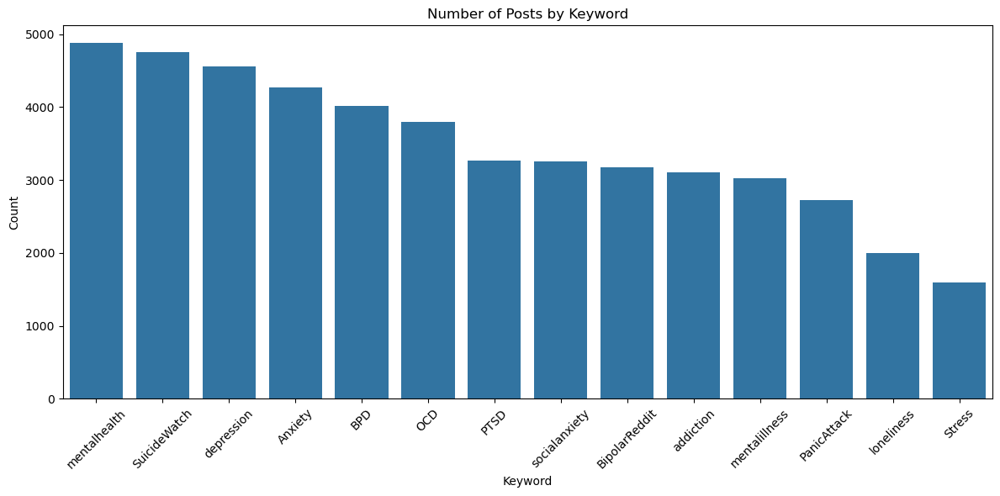

,Keyword,Count
0,mentalhealth,4874
1,SuicideWatch,4751
2,depression,4555
3,Anxiety,4266
4,BPD,4012
5,OCD,3800
6,PTSD,3269
7,socialanxiety,3253
8,BipolarReddit,3174
9,addiction,3109


In [15]:
# NUMBER OF POSTS WITH EACH KEYWORD
df_reddit = df_reddit[df_reddit['keyword'].notna()]
keyword_counts = df_reddit['keyword'].value_counts()
plt.figure(figsize=(12, 6))
# CREATE A DATAFRAME FOR THE KEYWORDS AND THEIR COUNTS
keyword_df = pd.DataFrame({
    'Keyword': keyword_counts.index,
    'Count': keyword_counts.values
})
sns.barplot(data=keyword_df, x='Keyword', y='Count')
plt.title('Number of Posts by Keyword')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()
keyword_df

In [16]:
from sklearn.feature_extraction.text import CountVectorizer
from collections import Counter
import pandas as pd
import matplotlib.pyplot as plt

In [17]:
def get_top_ngrams(corpus, ngram_range=(2, 2), n=None):
    vec = CountVectorizer(ngram_range=ngram_range, stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
    
    return words_freq[:n]

In [18]:
df_reddit['post_content'] = df_reddit['post_title'].fillna('') + ' ' + df_reddit['post_text'].fillna('')
top_bigrams = get_top_ngrams(df_reddit['post_content'], ngram_range=(2, 2), n=15)
top_trigrams = get_top_ngrams(df_reddit['post_content'], ngram_range=(3, 3), n=15)


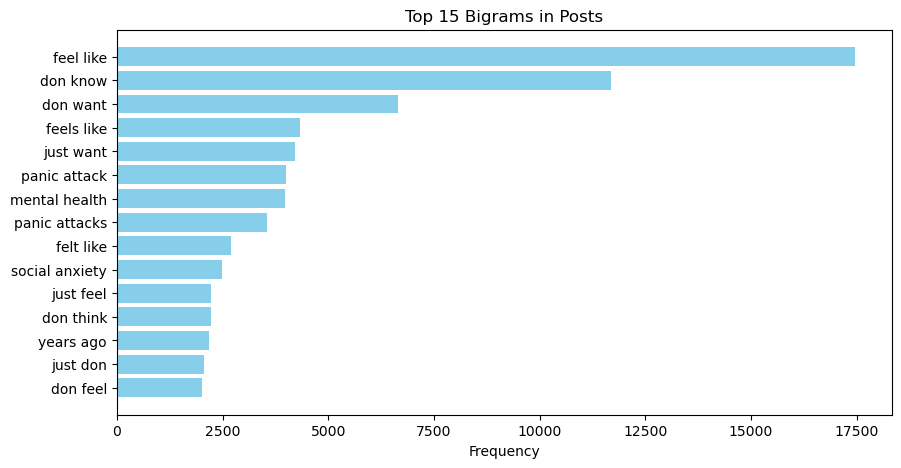

In [19]:
def plot_ngrams(ngrams, title):
    labels, values = zip(*ngrams)
    plt.figure(figsize=(10,5))
    plt.barh(labels[::-1], values[::-1], color='skyblue')
    plt.title(title)
    plt.xlabel("Frequency")
    plt.show()

plot_ngrams(top_bigrams, "Top 15 Bigrams in Posts")


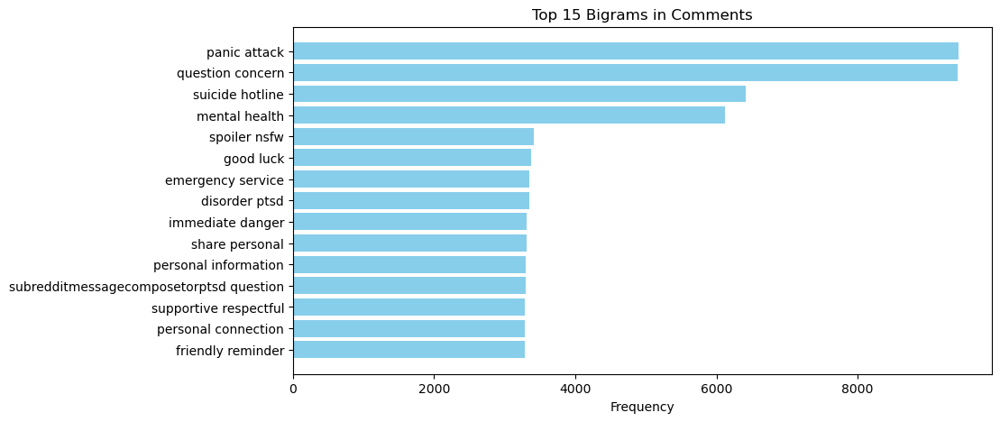

In [20]:
top_comment_bigrams = get_top_ngrams(df_reddit['comment_lemmas'].astype(str).tolist(), ngram_range=(2, 2), n=15)
plot_ngrams(top_comment_bigrams, "Top 15 Bigrams in Comments")


In [21]:
import pandas as pd
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# If not already, combine post title and text
df_reddit['post_content'] = df_reddit['post_title'].fillna('') + ' ' + df_reddit['post_text'].fillna('')

# Initialize VADER
analyzer = SentimentIntensityAnalyzer()

# Apply sentiment analysis
def get_sentiment(text):
    scores = analyzer.polarity_scores(text)
    compound = scores['compound']
    if compound >= 0.05:
        return 'positive'
    elif compound <= -0.05:
        return 'negative'
    else:
        return 'neutral'

df_reddit['sentiment'] = df_reddit['post_content'].apply(get_sentiment)

# To see sentiment for a specific post, e.g., the first one
print(df_reddit[['post_title', 'post_text', 'sentiment']].head(5))

                                          post_title  \
0                       I wish someone would just...   
1  A friend of mine once described depression as ...   
2  Therapist explained to me that normally people...   
3  Everyone says if you're depressed, don't be af...   
4                                Quiet quitting life   

                                           post_text sentiment  
0  Just fucking kill me. Shoot me. I wish I could...  negative  
1  And felt like that is the most apt description...  positive  
2  This has destroyed me. I’ve always thought may...  positive  
3  Well, we try to. And guess what? No one cares....  negative  
4  I am quiet quitting life and nobody realizes t...  positive  


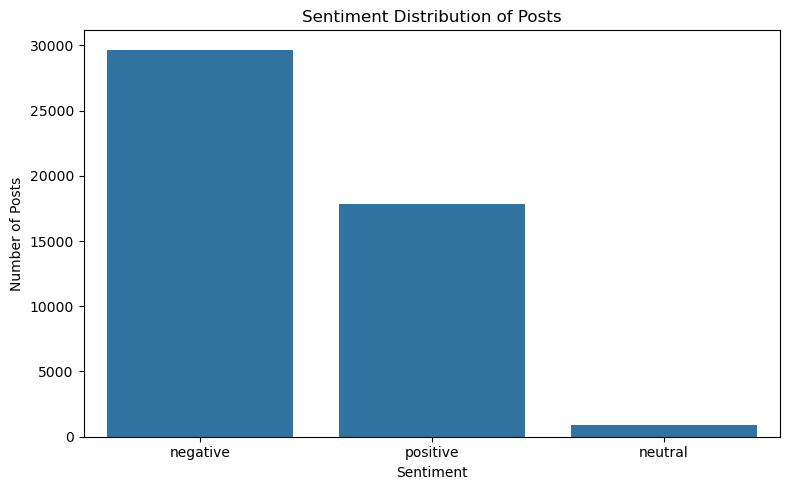

In [22]:
# Plot severity distribution
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(8, 5))
sns.countplot(data=df_reddit, x='sentiment', order=df_reddit['sentiment'].value_counts().index)
plt.title('Sentiment Distribution of Posts')
plt.xlabel('Sentiment')
plt.ylabel('Number of Posts')
plt.tight_layout()
plt.show()

In [25]:
# Example severity keywords dictionary
severity_keywords = {
    "high": ["suicide", "kill myself", "end my life", "self-harm", "hopeless", "worthless", "can't go on"],
    "moderate": ["depressed", "anxious", "panic", "crying", "overwhelmed", "lost", "empty"]
}

from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

analyzer = SentimentIntensityAnalyzer()

def keyword_severity(text):
    text_lower = str(text).lower()
    for word in severity_keywords["high"]:
        if word in text_lower:
            return "high"
    for word in severity_keywords["moderate"]:
        if word in text_lower:
            return "moderate"
    return "normal"

def combined_severity(text):
    kw_sev = keyword_severity(text)
    scores = analyzer.polarity_scores(str(text))
    compound = scores['compound']
    if kw_sev == "high":
        return "High"
    elif kw_sev == "moderate":
        if compound <= -0.5:
            return "High"
        else:
            return "Moderate"
    else:
        if compound <= -0.6:
            return "High"
        elif compound <= -0.3:
            return "Moderate"
        else:
            return "Normal"

df_reddit['severity_level'] = df_reddit['post_content'].apply(combined_severity)

print(df_reddit['severity_level'].value_counts())
print(df_reddit[['post_content', 'severity_level']].head())


severity_level
High        25546
Normal      15524
Moderate     7334
Name: count, dtype: int64
                                        post_content severity_level
0  I wish someone would just... Just fucking kill...           High
1  A friend of mine once described depression as ...         Normal
2  Therapist explained to me that normally people...       Moderate
3  Everyone says if you're depressed, don't be af...           High
4  Quiet quitting life I am quiet quitting life a...         Normal


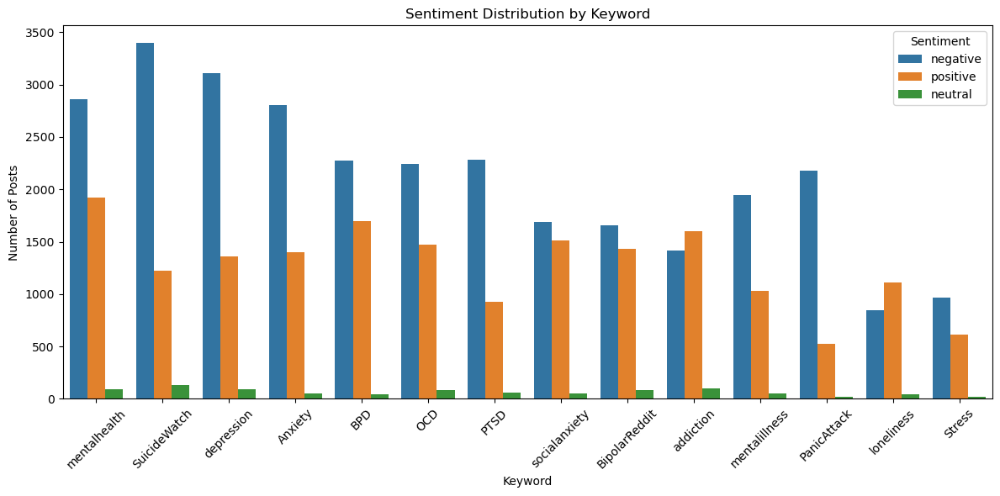

In [ ]:
# visualize sentiment by keyword
plt.figure(figsize=(12, 6))
sns.countplot(data=df_reddit, x='keyword', hue='sentiment', order=df_reddit['keyword'].value_counts().index)
plt.title('Sentiment Distribution by Keyword')
plt.xlabel('Keyword')
plt.ylabel('Number of Posts')
plt.legend(title='Sentiment')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()